In [3]:
%cd ../../

C:\Projects\python\recommender


In [4]:
from pathlib import Path
from functools import partial

import numpy as np
import pandas as pd
import torch as T
import torch.optim as optim

In [15]:
from datasets import SeqTopcoder
from models import FMLearner, TorchHrmFM, TorchPrmeFM, TorchFM
from models.fm_learner import simple_loss, trans_loss, simple_weight_loss, trans_weight_loss

In [6]:
DEVICE = T.cuda.current_device()
BATCH = 2000
SHUFFLE = True
WORKERS = 0
NEG_SAMPLE = 5
REGS_PATH = Path("./inputs/topcoder/regs.csv")
CHAG_PATH = Path("./inputs/topcoder/challenge.csv")

In [7]:
db = SeqTopcoder(regs_path=REGS_PATH, chag_path=CHAG_PATH)
db

Read dataset in inputs\topcoder\regs.csv
Original regs shape: (610025, 3)
Original registants size: 60017
Original challenges size: 39916
Filter dataframe shape: (544568, 3)
Index(['challengeId', 'period', 'date', 'prizes', 'technologies', 'platforms'], dtype='object')


In [8]:
db.config_db(batch_size=BATCH,
             shuffle=SHUFFLE,
             num_workers=WORKERS,
             device=DEVICE,
             neg_sample=NEG_SAMPLE)

In [9]:
feat_dim = db.feat_dim
NUM_DIM = 124
INIT_MEAN = 0.1
INIT_SCALE = 0.001

### Create Criterion

In [10]:
# regst setting
LINEAR_REG = 1
EMB_REG = 1
TRANS_REG = 1

In [11]:
simple_loss_callback = partial(simple_loss, LINEAR_REG, EMB_REG)
simple_loss_callback

functools.partial(<function simple_loss at 0x0000026FA802E828>, 1, 1)

## Train Models

### Hyper-parameters

In [12]:
feat_dim = db.feat_dim
NUM_DIM = 124
INIT_MEAN = 0.1
INIT_SCALE = 0.0001

In [13]:
LEARNING_RATE = 0.001
DECAY_FREQ = 1000
DECAY_GAMMA = 1

#### Train FM Model

In [16]:
fm_model = TorchFM(feature_dim=feat_dim, num_dim=NUM_DIM, init_mean=INIT_MEAN)
fm_model

TorchFM()

In [17]:
adam_opt = optim.Adam(fm_model.parameters(), lr=LEARNING_RATE)
schedular = optim.lr_scheduler.StepLR(adam_opt,
                                      step_size=DECAY_FREQ,
                                      gamma=DECAY_GAMMA)

In [18]:
fm_learner = FMLearner(fm_model, adam_opt, schedular, db)
fm_learner

In [19]:
fm_learner.compile(train_col='base',
                   valid_col='base',
                   test_col='base',
                   loss_callback=simple_loss_callback)

In [20]:
fm_learner.fit(epoch=3,
               log_dir="./runs/exp")

  0%|                                                                                                                                                                       | 0/3 [00:00<?, ?it/s]

Epoch: 0
Epoch 0 step 0: training loss: 38430.79287430432
Epoch 0 step 1: training accuarcy: 0.325
Epoch 0 step 1: training loss: 37182.922494864484
Epoch 0 step 2: training accuarcy: 0.40750000000000003
Epoch 0 step 2: training loss: 35959.37615701423
Epoch 0 step 3: training accuarcy: 0.47000000000000003
Epoch 0 step 3: training loss: 34920.08393668492
Epoch 0 step 4: training accuarcy: 0.4865
Epoch 0 step 4: training loss: 33821.984336018046
Epoch 0 step 5: training accuarcy: 0.5395
Epoch 0 step 5: training loss: 32782.78452083932
Epoch 0 step 6: training accuarcy: 0.5855
Epoch 0 step 6: training loss: 31781.24540844224
Epoch 0 step 7: training accuarcy: 0.6355000000000001
Epoch 0 step 7: training loss: 30849.662735289796
Epoch 0 step 8: training accuarcy: 0.6675
Epoch 0 step 8: training loss: 29959.842927075326
Epoch 0 step 9: training accuarcy: 0.683
Epoch 0 step 9: training loss: 29085.599103337612
Epoch 0 step 10: training accuarcy: 0.7035
Epoch 0 step 10: training loss: 28265.5

Epoch 0 step 85: training accuarcy: 0.9535
Epoch 0 step 85: training loss: 2769.7217197886844
Epoch 0 step 86: training accuarcy: 0.9515
Epoch 0 step 86: training loss: 2655.9943561063574
Epoch 0 step 87: training accuarcy: 0.9575
Epoch 0 step 87: training loss: 2592.569578730286
Epoch 0 step 88: training accuarcy: 0.9500000000000001
Epoch 0 step 88: training loss: 2511.966731193216
Epoch 0 step 89: training accuarcy: 0.9525
Epoch 0 step 89: training loss: 2414.557777195476
Epoch 0 step 90: training accuarcy: 0.9655
Epoch 0 step 90: training loss: 2362.4054967092948
Epoch 0 step 91: training accuarcy: 0.9530000000000001
Epoch 0 step 91: training loss: 2262.2352302303966
Epoch 0 step 92: training accuarcy: 0.967
Epoch 0 step 92: training loss: 2218.8276898598097
Epoch 0 step 93: training accuarcy: 0.96
Epoch 0 step 93: training loss: 2154.3024851972305
Epoch 0 step 94: training accuarcy: 0.9575
Epoch 0 step 94: training loss: 2085.4481864347676
Epoch 0 step 95: training accuarcy: 0.9585

Epoch 0 step 170: training loss: 374.481870052473
Epoch 0 step 171: training accuarcy: 0.9795
Epoch 0 step 171: training loss: 387.9761200331385
Epoch 0 step 172: training accuarcy: 0.9745
Epoch 0 step 172: training loss: 377.95979702575755
Epoch 0 step 173: training accuarcy: 0.9765
Epoch 0 step 173: training loss: 370.86611390007977
Epoch 0 step 174: training accuarcy: 0.976
Epoch 0 step 174: training loss: 360.5071909277923
Epoch 0 step 175: training accuarcy: 0.9795
Epoch 0 step 175: training loss: 366.4481108649361
Epoch 0 step 176: training accuarcy: 0.9735
Epoch 0 step 176: training loss: 358.96307471498665
Epoch 0 step 177: training accuarcy: 0.976
Epoch 0 step 177: training loss: 343.8239110170247
Epoch 0 step 178: training accuarcy: 0.9805
Epoch 0 step 178: training loss: 332.47035333337345
Epoch 0 step 179: training accuarcy: 0.9835
Epoch 0 step 179: training loss: 345.30839163779285
Epoch 0 step 180: training accuarcy: 0.978
Epoch 0 step 180: training loss: 342.808559600573

Epoch 0 step 256: training loss: 226.3471790353926
Epoch 0 step 257: training accuarcy: 0.9795
Epoch 0 step 257: training loss: 229.48536367788464
Epoch 0 step 258: training accuarcy: 0.981
Epoch 0 step 258: training loss: 221.15913480403083
Epoch 0 step 259: training accuarcy: 0.983
Epoch 0 step 259: training loss: 226.24871556356777
Epoch 0 step 260: training accuarcy: 0.981
Epoch 0 step 260: training loss: 222.06991126068127
Epoch 0 step 261: training accuarcy: 0.9785
Epoch 0 step 261: training loss: 224.65895615142384
Epoch 0 step 262: training accuarcy: 0.98
Epoch 0 step 262: training loss: 163.33806092808007
Epoch 0 step 263: training accuarcy: 0.9897435897435898
Epoch 0: train loss 4953.776504475951, train accuarcy 0.9065520167350769
Epoch 0: valid loss 347.67230804479505, valid accuarcy 0.9694764614105225


 33%|████████████████████████████████████████████████████▋                                                                                                         | 1/3 [01:43<03:27, 103.65s/it]

Epoch: 1
Epoch 1 step 263: training loss: 211.59053777176078
Epoch 1 step 264: training accuarcy: 0.9825
Epoch 1 step 264: training loss: 201.59645332591725
Epoch 1 step 265: training accuarcy: 0.986
Epoch 1 step 265: training loss: 213.41454497773228
Epoch 1 step 266: training accuarcy: 0.981
Epoch 1 step 266: training loss: 203.4935493334478
Epoch 1 step 267: training accuarcy: 0.9865
Epoch 1 step 267: training loss: 206.9315686793214
Epoch 1 step 268: training accuarcy: 0.983
Epoch 1 step 268: training loss: 211.08152620942926
Epoch 1 step 269: training accuarcy: 0.983
Epoch 1 step 269: training loss: 203.99685737959442
Epoch 1 step 270: training accuarcy: 0.987
Epoch 1 step 270: training loss: 204.49031037620426
Epoch 1 step 271: training accuarcy: 0.988
Epoch 1 step 271: training loss: 208.6338303340395
Epoch 1 step 272: training accuarcy: 0.9865
Epoch 1 step 272: training loss: 202.84981423996624
Epoch 1 step 273: training accuarcy: 0.99
Epoch 1 step 273: training loss: 199.24949

Epoch 1 step 349: training loss: 171.328824460328
Epoch 1 step 350: training accuarcy: 0.988
Epoch 1 step 350: training loss: 187.61655118461437
Epoch 1 step 351: training accuarcy: 0.9845
Epoch 1 step 351: training loss: 173.10093052503896
Epoch 1 step 352: training accuarcy: 0.9915
Epoch 1 step 352: training loss: 181.34852533030926
Epoch 1 step 353: training accuarcy: 0.988
Epoch 1 step 353: training loss: 178.30526902167722
Epoch 1 step 354: training accuarcy: 0.9935
Epoch 1 step 354: training loss: 181.1683079340014
Epoch 1 step 355: training accuarcy: 0.9895
Epoch 1 step 355: training loss: 179.76166925162886
Epoch 1 step 356: training accuarcy: 0.9895
Epoch 1 step 356: training loss: 177.17979017762696
Epoch 1 step 357: training accuarcy: 0.9885
Epoch 1 step 357: training loss: 178.74933142626668
Epoch 1 step 358: training accuarcy: 0.985
Epoch 1 step 358: training loss: 183.29410350909473
Epoch 1 step 359: training accuarcy: 0.9865
Epoch 1 step 359: training loss: 181.849235314

Epoch 1 step 435: training loss: 172.56460972460513
Epoch 1 step 436: training accuarcy: 0.988
Epoch 1 step 436: training loss: 172.24392856783982
Epoch 1 step 437: training accuarcy: 0.9865
Epoch 1 step 437: training loss: 169.49350908733794
Epoch 1 step 438: training accuarcy: 0.9895
Epoch 1 step 438: training loss: 162.53024000136074
Epoch 1 step 439: training accuarcy: 0.988
Epoch 1 step 439: training loss: 164.16616672349957
Epoch 1 step 440: training accuarcy: 0.9945
Epoch 1 step 440: training loss: 175.25961664321295
Epoch 1 step 441: training accuarcy: 0.989
Epoch 1 step 441: training loss: 166.65239159578528
Epoch 1 step 442: training accuarcy: 0.9885
Epoch 1 step 442: training loss: 175.0473283000024
Epoch 1 step 443: training accuarcy: 0.986
Epoch 1 step 443: training loss: 156.8315278392663
Epoch 1 step 444: training accuarcy: 0.991
Epoch 1 step 444: training loss: 161.5948257167967
Epoch 1 step 445: training accuarcy: 0.9915
Epoch 1 step 445: training loss: 173.71636111624

Epoch 1 step 521: training loss: 159.38676645937576
Epoch 1 step 522: training accuarcy: 0.991
Epoch 1 step 522: training loss: 158.86093276864563
Epoch 1 step 523: training accuarcy: 0.991
Epoch 1 step 523: training loss: 165.47206409277555
Epoch 1 step 524: training accuarcy: 0.9915
Epoch 1 step 524: training loss: 161.34812748909243
Epoch 1 step 525: training accuarcy: 0.9905
Epoch 1 step 525: training loss: 106.47668137794832
Epoch 1 step 526: training accuarcy: 0.9974358974358974
Epoch 1: train loss 176.72773130239796, train accuarcy 0.9765411615371704
Epoch 1: valid loss 274.33782001509735, valid accuarcy 0.9845361113548279


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 2/3 [03:20<01:41, 101.70s/it]

Epoch: 2
Epoch 2 step 526: training loss: 147.48899613247633
Epoch 2 step 527: training accuarcy: 0.9935
Epoch 2 step 527: training loss: 153.63392437617495
Epoch 2 step 528: training accuarcy: 0.992
Epoch 2 step 528: training loss: 145.8832369880235
Epoch 2 step 529: training accuarcy: 0.9905
Epoch 2 step 529: training loss: 146.5767330251225
Epoch 2 step 530: training accuarcy: 0.9945
Epoch 2 step 530: training loss: 147.37218333481007
Epoch 2 step 531: training accuarcy: 0.994
Epoch 2 step 531: training loss: 156.4687333254866
Epoch 2 step 532: training accuarcy: 0.9915
Epoch 2 step 532: training loss: 148.94066673061417
Epoch 2 step 533: training accuarcy: 0.995
Epoch 2 step 533: training loss: 142.95108246540798
Epoch 2 step 534: training accuarcy: 0.994
Epoch 2 step 534: training loss: 151.02053178544318
Epoch 2 step 535: training accuarcy: 0.9945
Epoch 2 step 535: training loss: 153.29059976977572
Epoch 2 step 536: training accuarcy: 0.9925
Epoch 2 step 536: training loss: 147.5

Epoch 2 step 612: training loss: 144.436056071118
Epoch 2 step 613: training accuarcy: 0.9935
Epoch 2 step 613: training loss: 146.1937277540793
Epoch 2 step 614: training accuarcy: 0.994
Epoch 2 step 614: training loss: 152.96039588293837
Epoch 2 step 615: training accuarcy: 0.9905
Epoch 2 step 615: training loss: 149.14348160485304
Epoch 2 step 616: training accuarcy: 0.994
Epoch 2 step 616: training loss: 150.30593737568066
Epoch 2 step 617: training accuarcy: 0.994
Epoch 2 step 617: training loss: 157.43402274050595
Epoch 2 step 618: training accuarcy: 0.992
Epoch 2 step 618: training loss: 151.74151766291521
Epoch 2 step 619: training accuarcy: 0.993
Epoch 2 step 619: training loss: 156.2862920720946
Epoch 2 step 620: training accuarcy: 0.9925
Epoch 2 step 620: training loss: 142.44056624282842
Epoch 2 step 621: training accuarcy: 0.9945
Epoch 2 step 621: training loss: 150.1034414481886
Epoch 2 step 622: training accuarcy: 0.991
Epoch 2 step 622: training loss: 160.01236505733144

Epoch 2 step 698: training accuarcy: 0.994
Epoch 2 step 698: training loss: 149.595094530947
Epoch 2 step 699: training accuarcy: 0.993
Epoch 2 step 699: training loss: 141.932203148358
Epoch 2 step 700: training accuarcy: 0.995
Epoch 2 step 700: training loss: 138.69675650337038
Epoch 2 step 701: training accuarcy: 0.9945
Epoch 2 step 701: training loss: 141.0356637190397
Epoch 2 step 702: training accuarcy: 0.993
Epoch 2 step 702: training loss: 133.30576014017288
Epoch 2 step 703: training accuarcy: 0.9955
Epoch 2 step 703: training loss: 155.72218062109786
Epoch 2 step 704: training accuarcy: 0.9895
Epoch 2 step 704: training loss: 139.74048710330422
Epoch 2 step 705: training accuarcy: 0.9925
Epoch 2 step 705: training loss: 141.12173430831066
Epoch 2 step 706: training accuarcy: 0.9925
Epoch 2 step 706: training loss: 143.72522436700334
Epoch 2 step 707: training accuarcy: 0.995
Epoch 2 step 707: training loss: 137.02708021819507
Epoch 2 step 708: training accuarcy: 0.996
Epoch 2

Epoch 2 step 784: training accuarcy: 0.9955
Epoch 2 step 784: training loss: 137.94743372266493
Epoch 2 step 785: training accuarcy: 0.9935
Epoch 2 step 785: training loss: 145.6663604625365
Epoch 2 step 786: training accuarcy: 0.9965
Epoch 2 step 786: training loss: 142.93300580358547
Epoch 2 step 787: training accuarcy: 0.996
Epoch 2 step 787: training loss: 137.14305005302617
Epoch 2 step 788: training accuarcy: 0.9935
Epoch 2 step 788: training loss: 102.37638181177014
Epoch 2 step 789: training accuarcy: 0.9935897435897436
Epoch 2: train loss 147.43087529345812, train accuarcy 0.9881117939949036
Epoch 2: valid loss 250.1866460136849, valid accuarcy 0.990802526473999


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [04:57<00:00, 99.31s/it]


In [22]:
emb_array = fm_model.param_emb.data.cpu().numpy()
emb_array.shape

(87178, 124)

In [23]:
np.save("./inputs/params/fm_topcoder_emb", emb_array)

In [24]:
del fm_model
T.cuda.empty_cache()

### Train HRM FM Model

In [16]:
hrm_model = TorchHrmFM(feature_dim=feat_dim, num_dim=NUM_DIM, init_mean=INIT_MEAN)
hrm_model

TorchHrmFM()

In [19]:
adam_opt = optim.Adam(hrm_model.parameters(), lr=LEARNING_RATE)
schedular = optim.lr_scheduler.StepLR(adam_opt,
                                      step_size=DECAY_FREQ,
                                      gamma=DECAY_GAMMA)

In [20]:
hrm_learner = FMLearner(hrm_model, adam_opt, schedular, db)
hrm_learner

In [22]:
hrm_learner.compile(train_col='base',
                   valid_col='base',
                   test_col='base',
                   loss_callback=simple_loss_callback)

In [23]:
hrm_learner.fit(epoch=3, log_dir="./runs/exp")

loss: 1086.8963233051416
Epoch 2 step 583: training accuarcy: 0.8005
Epoch 2 step 583: training loss: 1068.3995006460889
Epoch 2 step 584: training accuarcy: 0.8005
Epoch 2 step 584: training loss: 1074.103733281846
Epoch 2 step 585: training accuarcy: 0.799
Epoch 2 step 585: training loss: 1106.7761937271882
Epoch 2 step 586: training accuarcy: 0.7965
Epoch 2 step 586: training loss: 1092.0619204468392
Epoch 2 step 587: training accuarcy: 0.805
Epoch 2 step 587: training loss: 1082.3497628768314
Epoch 2 step 588: training accuarcy: 0.7965
Epoch 2 step 588: training loss: 1081.871731477513
Epoch 2 step 589: training accuarcy: 0.807
Epoch 2 step 589: training loss: 1063.784827774208
Epoch 2 step 590: training accuarcy: 0.808
Epoch 2 step 590: training loss: 1063.2747278695822
Epoch 2 step 591: training accuarcy: 0.797
Epoch 2 step 591: training loss: 1065.6906588094844
Epoch 2 step 592: training accuarcy: 0.8015
Epoch 2 step 592: training loss: 1069.600096908849
Epoch 2 step 593: traini

In [28]:
emb_array = hrm_model.param_emb.data.cpu().numpy()
emb_array.shape

(87178, 124)

In [37]:
# Save embedding array
np.save("./inputs/params/hrm_topcoder_emb", emb_array)

### Train PRME Model

In [25]:
prme_model = TorchPrmeFM(feature_dim=feat_dim, num_dim=NUM_DIM, init_mean=INIT_MEAN)
prme_model

TorchPrmeFM()

In [26]:
adam_opt = optim.Adam(prme_model.parameters(), lr=LEARNING_RATE)
schedular = optim.lr_scheduler.StepLR(adam_opt,
                                      step_size=DECAY_FREQ,
                                      gamma=DECAY_GAMMA)

In [27]:
prme_learner = FMLearner(prme_model, adam_opt, schedular, db)
prme_learner

In [28]:
prme_learner.compile(train_col='base',
                     valid_col='base',
                     test_col='base',
                     loss_callback=simple_loss_callback)

In [29]:
prme_learner.fit(epoch=3,
                 log_dir="./runs/exp")

  0%|                                               | 0/3 [00:00<?, ?it/s]

Epoch: 0
Epoch 0 step 0: training loss: 46456.43885789444
Epoch 0 step 1: training accuarcy: 0.5215
Epoch 0 step 1: training loss: 44987.03581155598
Epoch 0 step 2: training accuarcy: 0.5095000000000001
Epoch 0 step 2: training loss: 44068.0823520097
Epoch 0 step 3: training accuarcy: 0.519
Epoch 0 step 3: training loss: 42321.095790401596
Epoch 0 step 4: training accuarcy: 0.5365
Epoch 0 step 4: training loss: 41518.28018420636
Epoch 0 step 5: training accuarcy: 0.5335
Epoch 0 step 5: training loss: 40045.89979563365
Epoch 0 step 6: training accuarcy: 0.535
Epoch 0 step 6: training loss: 39239.056547648084
Epoch 0 step 7: training accuarcy: 0.5215
Epoch 0 step 7: training loss: 38170.88605006663
Epoch 0 step 8: training accuarcy: 0.5455
Epoch 0 step 8: training loss: 36926.956458748034
Epoch 0 step 9: training accuarcy: 0.532
Epoch 0 step 9: training loss: 35790.74043474761
Epoch 0 step 10: training accuarcy: 0.5495
Epoch 0 step 10: training loss: 35340.60367163184
Epoch 0 step 11: tr

Epoch 0 step 87: training loss: 3982.7088993490197
Epoch 0 step 88: training accuarcy: 0.577
Epoch 0 step 88: training loss: 3853.1624201612385
Epoch 0 step 89: training accuarcy: 0.597
Epoch 0 step 89: training loss: 3820.225355011519
Epoch 0 step 90: training accuarcy: 0.577
Epoch 0 step 90: training loss: 3729.1312591052874
Epoch 0 step 91: training accuarcy: 0.594
Epoch 0 step 91: training loss: 3636.188780447678
Epoch 0 step 92: training accuarcy: 0.59
Epoch 0 step 92: training loss: 3525.699032803536
Epoch 0 step 93: training accuarcy: 0.6095
Epoch 0 step 93: training loss: 3465.989860672328
Epoch 0 step 94: training accuarcy: 0.6055
Epoch 0 step 94: training loss: 3390.6500892841423
Epoch 0 step 95: training accuarcy: 0.6035
Epoch 0 step 95: training loss: 3365.0182797334032
Epoch 0 step 96: training accuarcy: 0.5915
Epoch 0 step 96: training loss: 3289.8847621094014
Epoch 0 step 97: training accuarcy: 0.599
Epoch 0 step 97: training loss: 3219.270869472137
Epoch 0 step 98: trai

Epoch 0 step 172: training accuarcy: 0.715
Epoch 0 step 172: training loss: 1440.9179308686303
Epoch 0 step 173: training accuarcy: 0.742
Epoch 0 step 173: training loss: 1425.7337984968449
Epoch 0 step 174: training accuarcy: 0.737
Epoch 0 step 174: training loss: 1430.01083433624
Epoch 0 step 175: training accuarcy: 0.732
Epoch 0 step 175: training loss: 1424.350564873242
Epoch 0 step 176: training accuarcy: 0.735
Epoch 0 step 176: training loss: 1407.57771901349
Epoch 0 step 177: training accuarcy: 0.7255
Epoch 0 step 177: training loss: 1382.98275933487
Epoch 0 step 178: training accuarcy: 0.7315
Epoch 0 step 178: training loss: 1397.7448434111989
Epoch 0 step 179: training accuarcy: 0.727
Epoch 0 step 179: training loss: 1373.5628860351708
Epoch 0 step 180: training accuarcy: 0.7485
Epoch 0 step 180: training loss: 1382.1916704388234
Epoch 0 step 181: training accuarcy: 0.7375
Epoch 0 step 181: training loss: 1385.3085000273181
Epoch 0 step 182: training accuarcy: 0.734
Epoch 0 st

Epoch 0 step 255: training loss: 1138.7159389404087
Epoch 0 step 256: training accuarcy: 0.759
Epoch 0 step 256: training loss: 1182.084516902597
Epoch 0 step 257: training accuarcy: 0.756
Epoch 0 step 257: training loss: 1168.7266564100605
Epoch 0 step 258: training accuarcy: 0.7725
Epoch 0 step 258: training loss: 1136.0899892471568
Epoch 0 step 259: training accuarcy: 0.7775
Epoch 0 step 259: training loss: 1192.4710842223315
Epoch 0 step 260: training accuarcy: 0.755
Epoch 0 step 260: training loss: 1207.7162843423805
Epoch 0 step 261: training accuarcy: 0.764
Epoch 0 step 261: training loss: 1166.444609946183
Epoch 0 step 262: training accuarcy: 0.7675000000000001
Epoch 0 step 262: training loss: 486.0674251403832
Epoch 0 step 263: training accuarcy: 0.7833333333333333
Epoch 0: train loss 6822.139035928375, train accuarcy 0.6393573880195618
Epoch 0: valid loss 1147.5373404514207, valid accuarcy 0.7615726590156555


 33%|█████████████                          | 1/3 [01:39<03:18, 99.25s/it]

Epoch: 1
Epoch 1 step 263: training loss: 1184.3886175930566
Epoch 1 step 264: training accuarcy: 0.7495
Epoch 1 step 264: training loss: 1179.290020108052
Epoch 1 step 265: training accuarcy: 0.7605000000000001
Epoch 1 step 265: training loss: 1178.70875348592
Epoch 1 step 266: training accuarcy: 0.7715
Epoch 1 step 266: training loss: 1161.1486961011842
Epoch 1 step 267: training accuarcy: 0.7625000000000001
Epoch 1 step 267: training loss: 1169.5174561875042
Epoch 1 step 268: training accuarcy: 0.767
Epoch 1 step 268: training loss: 1171.5493441201231
Epoch 1 step 269: training accuarcy: 0.7525000000000001
Epoch 1 step 269: training loss: 1130.2808240638585
Epoch 1 step 270: training accuarcy: 0.7765
Epoch 1 step 270: training loss: 1161.1868658308308
Epoch 1 step 271: training accuarcy: 0.7675000000000001
Epoch 1 step 271: training loss: 1147.2914888144114
Epoch 1 step 272: training accuarcy: 0.783
Epoch 1 step 272: training loss: 1146.5913413570293
Epoch 1 step 273: training accua

Epoch 1 step 348: training accuarcy: 0.7955
Epoch 1 step 348: training loss: 1094.9916355952748
Epoch 1 step 349: training accuarcy: 0.7955
Epoch 1 step 349: training loss: 1122.2284942804108
Epoch 1 step 350: training accuarcy: 0.7795
Epoch 1 step 350: training loss: 1133.5237453254622
Epoch 1 step 351: training accuarcy: 0.7755
Epoch 1 step 351: training loss: 1131.0819313086279
Epoch 1 step 352: training accuarcy: 0.77
Epoch 1 step 352: training loss: 1128.3605126551383
Epoch 1 step 353: training accuarcy: 0.778
Epoch 1 step 353: training loss: 1111.7389328878678
Epoch 1 step 354: training accuarcy: 0.786
Epoch 1 step 354: training loss: 1117.8403627155374
Epoch 1 step 355: training accuarcy: 0.782
Epoch 1 step 355: training loss: 1133.6609631654014
Epoch 1 step 356: training accuarcy: 0.7755
Epoch 1 step 356: training loss: 1129.1021872899378
Epoch 1 step 357: training accuarcy: 0.7895
Epoch 1 step 357: training loss: 1133.1375721578113
Epoch 1 step 358: training accuarcy: 0.781
Ep

Epoch 1 step 434: training accuarcy: 0.774
Epoch 1 step 434: training loss: 1106.0903475704056
Epoch 1 step 435: training accuarcy: 0.7835
Epoch 1 step 435: training loss: 1095.9981993027102
Epoch 1 step 436: training accuarcy: 0.7985
Epoch 1 step 436: training loss: 1084.65254722738
Epoch 1 step 437: training accuarcy: 0.7965
Epoch 1 step 437: training loss: 1101.2397474867862
Epoch 1 step 438: training accuarcy: 0.792
Epoch 1 step 438: training loss: 1102.2391357069214
Epoch 1 step 439: training accuarcy: 0.8
Epoch 1 step 439: training loss: 1089.1836212423652
Epoch 1 step 440: training accuarcy: 0.7975
Epoch 1 step 440: training loss: 1082.466312182209
Epoch 1 step 441: training accuarcy: 0.801
Epoch 1 step 441: training loss: 1102.0101972414375
Epoch 1 step 442: training accuarcy: 0.789
Epoch 1 step 442: training loss: 1062.0135983771524
Epoch 1 step 443: training accuarcy: 0.8065
Epoch 1 step 443: training loss: 1100.8046498711874
Epoch 1 step 444: training accuarcy: 0.7935
Epoch 

Epoch 1 step 519: training loss: 1090.5066139790194
Epoch 1 step 520: training accuarcy: 0.7875
Epoch 1 step 520: training loss: 1083.3917562498227
Epoch 1 step 521: training accuarcy: 0.804
Epoch 1 step 521: training loss: 1089.671363796877
Epoch 1 step 522: training accuarcy: 0.803
Epoch 1 step 522: training loss: 1072.8296816049083
Epoch 1 step 523: training accuarcy: 0.7995
Epoch 1 step 523: training loss: 1110.7545291058807
Epoch 1 step 524: training accuarcy: 0.7985
Epoch 1 step 524: training loss: 1109.7821625101415
Epoch 1 step 525: training accuarcy: 0.7935
Epoch 1 step 525: training loss: 440.6465290037823
Epoch 1 step 526: training accuarcy: 0.8179487179487179
Epoch 1: train loss 1103.6898172916942, train accuarcy 0.7356141805648804
Epoch 1: valid loss 1063.3885502365433, valid accuarcy 0.799878716468811


 67%|██████████████████████████             | 2/3 [03:19<01:39, 99.55s/it]

Epoch: 2
Epoch 2 step 526: training loss: 1072.5283307773257
Epoch 2 step 527: training accuarcy: 0.805
Epoch 2 step 527: training loss: 1066.872412328467
Epoch 2 step 528: training accuarcy: 0.806
Epoch 2 step 528: training loss: 1104.5800047156717
Epoch 2 step 529: training accuarcy: 0.8015
Epoch 2 step 529: training loss: 1113.162956956334
Epoch 2 step 530: training accuarcy: 0.8005
Epoch 2 step 530: training loss: 1097.6150580901767
Epoch 2 step 531: training accuarcy: 0.786
Epoch 2 step 531: training loss: 1069.5093317087862
Epoch 2 step 532: training accuarcy: 0.8065
Epoch 2 step 532: training loss: 1075.237658970193
Epoch 2 step 533: training accuarcy: 0.8
Epoch 2 step 533: training loss: 1062.843782287206
Epoch 2 step 534: training accuarcy: 0.805
Epoch 2 step 534: training loss: 1111.923875185969
Epoch 2 step 535: training accuarcy: 0.793
Epoch 2 step 535: training loss: 1081.2747026115746
Epoch 2 step 536: training accuarcy: 0.81
Epoch 2 step 536: training loss: 1115.30122059

Epoch 2 step 611: training accuarcy: 0.806
Epoch 2 step 611: training loss: 1056.0742851943544
Epoch 2 step 612: training accuarcy: 0.8095
Epoch 2 step 612: training loss: 1082.2718729816488
Epoch 2 step 613: training accuarcy: 0.803
Epoch 2 step 613: training loss: 1102.9658818303217
Epoch 2 step 614: training accuarcy: 0.8035
Epoch 2 step 614: training loss: 1054.5806681539482
Epoch 2 step 615: training accuarcy: 0.7965
Epoch 2 step 615: training loss: 1052.3129352835238
Epoch 2 step 616: training accuarcy: 0.8055
Epoch 2 step 616: training loss: 1063.0206601763762
Epoch 2 step 617: training accuarcy: 0.8125
Epoch 2 step 617: training loss: 1065.1361404910606
Epoch 2 step 618: training accuarcy: 0.8130000000000001
Epoch 2 step 618: training loss: 1060.6985474346673
Epoch 2 step 619: training accuarcy: 0.8180000000000001
Epoch 2 step 619: training loss: 1062.9028481764408
Epoch 2 step 620: training accuarcy: 0.8085
Epoch 2 step 620: training loss: 1097.1322425583223
Epoch 2 step 621: 

Epoch 2 step 695: training loss: 1063.8433312630818
Epoch 2 step 696: training accuarcy: 0.8250000000000001
Epoch 2 step 696: training loss: 1044.4181519279548
Epoch 2 step 697: training accuarcy: 0.8045
Epoch 2 step 697: training loss: 1090.431257514146
Epoch 2 step 698: training accuarcy: 0.796
Epoch 2 step 698: training loss: 1061.892187757815
Epoch 2 step 699: training accuarcy: 0.805
Epoch 2 step 699: training loss: 1087.2914193244453
Epoch 2 step 700: training accuarcy: 0.795
Epoch 2 step 700: training loss: 1062.4279494157354
Epoch 2 step 701: training accuarcy: 0.8035
Epoch 2 step 701: training loss: 1105.3356973986201
Epoch 2 step 702: training accuarcy: 0.791
Epoch 2 step 702: training loss: 1032.337249713145
Epoch 2 step 703: training accuarcy: 0.8095
Epoch 2 step 703: training loss: 1092.407841451562
Epoch 2 step 704: training accuarcy: 0.8125
Epoch 2 step 704: training loss: 1094.5681106005993
Epoch 2 step 705: training accuarcy: 0.8140000000000001
Epoch 2 step 705: traini

Epoch 2 step 780: training accuarcy: 0.798
Epoch 2 step 780: training loss: 1046.8707283968574
Epoch 2 step 781: training accuarcy: 0.805
Epoch 2 step 781: training loss: 1032.6746120855607
Epoch 2 step 782: training accuarcy: 0.8195
Epoch 2 step 782: training loss: 1071.8294471210004
Epoch 2 step 783: training accuarcy: 0.8230000000000001
Epoch 2 step 783: training loss: 1029.6303542264145
Epoch 2 step 784: training accuarcy: 0.8130000000000001
Epoch 2 step 784: training loss: 1082.387651007722
Epoch 2 step 785: training accuarcy: 0.7985
Epoch 2 step 785: training loss: 1054.4814515300789
Epoch 2 step 786: training accuarcy: 0.8075
Epoch 2 step 786: training loss: 1040.2759234611074
Epoch 2 step 787: training accuarcy: 0.8135
Epoch 2 step 787: training loss: 1063.3235282295925
Epoch 2 step 788: training accuarcy: 0.7925
Epoch 2 step 788: training loss: 452.8543203353489
Epoch 2 step 789: training accuarcy: 0.8038461538461539
Epoch 2: train loss 1066.0772913429414, train accuarcy 0.748

100%|██████████████████████████████████████| 3/3 [05:00<00:00, 100.30s/it]


In [30]:
emb_array = prme_model.param_emb.data.cpu().numpy()
emb_array.shape

(87178, 124)

In [31]:
np.save("./inputs/params/prme_topcoder_emb", emb_array)

### Dimension Reduction

#### PCA Decomposition

In [29]:
from sklearn.decomposition import PCA

In [30]:
pca = PCA(n_components=2)

In [31]:
emb2 = pca.fit_transform(emb_array)
emb2.shape

(87178, 2)

In [ ]:
b

### Draw plot for decomposition

In [32]:
df2 = pd.DataFrame(data=emb2, columns=['x', 'y'])
df2.head()

,x,y
0,-0.000397,-0.000061
1,0.000211,0.000143
2,-0.000025,-0.000008
3,-0.000063,0.000025
4,-0.043241,0.006871


In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()

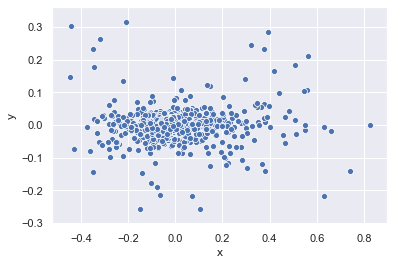

In [35]:
sns.scatterplot(x='x', y='y', data=df2)

#### SVD Decomposition

In [36]:
from sklearn.decomposition import TruncatedSVD

In [ ]:
svd = TruncatedSVD(n)